In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 6.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=4db5c9466eb732ce68ea8e7ad88faa7190002bbfd104ea0c1f2b6c0e168ebbfb
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


Connecting to Drive

In [ ]:
import glob
import re
import pickle
import string

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from nltk.tokenize import word_tokenize
stopwords_list ='stopwords-bn.txt'
%matplotlib inline

In [ ]:
# d_train =pd.read_excel('/content/train_emotion.xlsx')
# d_test =pd.read_excel('/content/test_emotion.xlsx')

In [ ]:
# df_corpus =pd.read_excel('/content/corpus_all.xlsx')
# d_cleaned =pd.read_excel('/content/cleaned_BEmoC7k.xlsx')

In [ ]:
# unique_classes = df_corpus['comment_type'].unique()

# # Print the unique class names
# print(unique_classes)

In [ ]:
# unique_classes = d_cleaned['comment_type'].unique()

# # Print the unique class names
# print(unique_classes)

In [ ]:
# unique_classes = d_train['comment_type'].unique()

# # Print the unique class names
# print(unique_classes)

In [ ]:
# # Concatenate the four dataframes
# df_combined = pd.concat([df_corpus, d_cleaned, d_train, d_test], ignore_index=True)

# # Export the combined dataframe to an Excel file
# df_combined.to_excel('combined_dataset.xlsx', index=False)

In [ ]:
df_combined_data = pd.read_excel('/content/combined_dataset.xlsx')

In [ ]:
unique_classes = df_combined_data['comment_type'].unique()

# Print the unique class names
print(unique_classes)

['sadness' 'angry' 'joy' 'disgust' 'surprise' 'fear']


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from collections import Counter

# Read the dataset
df_combined_data = pd.read_excel('/content/combined_dataset.xlsx')

# Separate features and target
comments = df_combined_data['comment']
targets = df_combined_data['comment_type']

# Define a dictionary to map target classes to numerical values
class_mapping = {
    'sadness': 0,
    'joy': 1,
    'angry': 2,
    'disgust': 3,
    'surprise': 4,
    'fear': 5
}

# Convert target classes to numerical values
numerical_targets = [class_mapping[target] for target in targets]

# Create a new dataframe with the numerical targets
df_numerical = pd.DataFrame({
    'comment': comments,
    'target': numerical_targets
})

# Separate features and target
features = df_numerical['comment']
target = df_numerical['target']

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2)

# Balance the class distribution of the training data
class_counts = Counter(y_train)
majority_class_count = max(class_counts.values())

for class_name, count in class_counts.items():
    if count < majority_class_count:
        # Oversample minority classes
        X_train_minority = X_train[y_train == class_name]
        y_train_minority = y_train[y_train == class_name]
        oversample_count = majority_class_count - count
        X_train_minority_oversampled = X_train_minority.sample(n=oversample_count, replace=True)
        y_train_minority_oversampled = y_train_minority.sample(n=oversample_count, replace=True)
        X_train = pd.concat([X_train, X_train_minority_oversampled], ignore_index=True)
        y_train = pd.concat([y_train, y_train_minority_oversampled], ignore_index=True)

# Create dataframes for balanced training and test sets
d_train = pd.DataFrame({
    'comment': X_train,
    'target': y_train
})

d_test = pd.DataFrame({
    'comment': X_test,
    'target': y_test
})

# Save the dataframes to Excel files
d_train.to_excel('d_train_balanced.xlsx', index=False)
d_test.to_excel('d_test_balanced.xlsx', index=False)

In [ ]:
# Rename the column in d_train
d_train.rename(columns={'target': 'comment_type'}, inplace=True)

# Rename the column in d_test
d_test.rename(columns={'target': 'comment_type'}, inplace=True)

In [ ]:
print(d_train.head())
print(d_test.head())

                                             comment  comment_type
0  আমি অস্থিরিত বিরক্ত এবং উত্সর্গীকৃত অনুভূতি বা...             1
1             আমি উদ্বিগ্ন এবং খুশি বোধ কাজ করতে চাই             1
2   Aaron Coook stop trying to figure out your ch...             4
3  আমি সাহসী বোধ করছিলাম যদিও আমি আমার সালাদের জন...             1
4  সরকারি লোক, জনগনের টাকা অপচয় করে বিলাসিতা করে,...             3
                                                 comment  comment_type
6387   যারা কুকুর বিড়াল সাপ ব্যংঙ খায় এদের ঐসব কোন ব্...             3
29971  আমি কয়েক সপ্তাহ আগে মঞ্জুর হয়েছি সত্যই অদ্ভু...             2
41530   fsoulabaille  flopcb  alicecoffin     মিত্র এ...             4
30685                   আমি তিক্ত এবং alousর্ষা বোধ করছি             2
10328             ছিঃ এভাবে অপমান নিজের দেশের মুভিকে ছিঃ             3


In [ ]:
def remove_punctuation(word):
    for punkt in list(string.punctuation):
        word = word.replace(punkt, '')

    return word

In [ ]:
def cleansing(text):
    text = text.lower()
    word_list = word_tokenize(text)
    word_list = [word for word in word_list if len(word) > 1]
    word_list = [remove_punctuation(word) for word in word_list]
    text = ' '.join(word_list)

    return text

In [ ]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
d_train['content_cleansing'] = d_train.comment.apply(cleansing)
d_test['content_cleansing'] = d_test.comment.apply(cleansing)

In [ ]:
def remove_punctuations_emojis(text):

    bangla_punctuations = '।'
    cleaned_text = re.sub(r'['+bangla_punctuations+']', '', str(text))


    emoji_pattern = re.compile("["
                               u"\U0001F600-\U0001F64F"  # emoticons
                               u"\U0001F300-\U0001F5FF"  # symbols & pictographs
                               u"\U0001F680-\U0001F6FF"  # transport & map symbols
                               u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                               u"\U00002702-\U000027B0"
                               u"\U000024C2-\U0001F251"
                               "]+", flags=re.UNICODE)
    cleaned_text = emoji_pattern.sub(r'', cleaned_text)

    return cleaned_text


d_train['content_cleansing'] = d_train['content_cleansing'].apply(remove_punctuations_emojis)
d_test['content_cleansing'] = d_test['content_cleansing'].apply(remove_punctuations_emojis)

In [ ]:
!pip install bnlp-toolkit

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.4/54.4 kB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.4/175.4 kB 13.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 44.1 MB/s eta 0:00:00
  Created wheel for emoji: filename=emoji-1.7.0-py3-none-any.whl size=171034 sha256=fc85bf2e44eb4d1e5f6ef4cc5d19a918a4a0af45b44c9d9850f2f010034436b6
  Stored in directory: /root/.cache/pip/wheels/31/8a/8c/315c9e5d7773f74b33d5ed33f075b49c6eaeb7cedbb86e2cf8
Successfully built emoji


In [ ]:
from bnlp import BasicTokenizer
basic_tokenizer = BasicTokenizer()

In [ ]:
d_train['cont_clean_len_token'] = d_train.content_cleansing.apply(lambda x: len(basic_tokenizer.tokenize(x)))
d_test['cont_clean_len_token'] = d_test.content_cleansing.apply(lambda x: len(basic_tokenizer.tokenize(x)))

In [ ]:
# from utils import cleaned_reviews,stopwords_info,stopword_removal,process_reviews
# d_train['content_cleansing'] = d_train['content_cleansing'].apply(process_reviews,stopwords = stopwords_list,removing_stopwords = True)
# d_test['content_cleansing'] = d_test['content_cleansing'].apply(process_reviews,stopwords = stopwords_list,removing_stopwords = True)

In [ ]:
# d_train['cont_clean_len_token'] = d_train.content_cleansing.apply(lambda x: len(word_tokenize(x)))
# d_test['cont_clean_len_token'] = d_test.content_cleansing.apply(lambda x: len(word_tokenize(x)))

**Bi-GRU-LSTM-CNN**

In [ ]:
!pip install keras-preprocessing

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 1.7 MB/s eta 0:00:00


In [ ]:
from sklearn.base import BaseEstimator, TransformerMixin
from keras.layers import concatenate, Conv1D, GRU
from keras.layers import GlobalAveragePooling1D, GlobalMaxPooling1D
from tensorflow.keras.utils import plot_model, model_to_dot
import tensorflow as tf
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Input
from keras import backend as K
from tensorflow.keras import Input, Model
from tensorflow.keras.layers import Embedding, SpatialDropout1D, Bidirectional, GRU, Conv1D, GlobalAveragePooling1D, GlobalMaxPooling1D, concatenate, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras.metrics import Accuracy
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
import re
import numpy as np
from tensorflow.keras.layers import MaxPooling1D
import random

In [ ]:
K.clear_session()

class KerasTextClassifier(BaseEstimator, TransformerMixin):
    '''Wrapper class for keras text classification models that takes raw text as input.'''
    # def f1_score(y_true, y_pred):
    #     true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    #     possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    #     predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    #     precision = true_positives / (predicted_positives + K.epsilon())
    #     recall = true_positives / (possible_positives + K.epsilon())
    #     f1_val = 2 * (precision * recall) / (precision + recall + K.epsilon())
    #     return f1_val

    def __init__(self, max_words=300000, input_length=200, emb_dim=100, n_classes=6, epochs=5, batch_size=16):
        self.max_words = max_words
        self.input_length = input_length
        self.emb_dim = emb_dim
        self.n_classes = n_classes
        self.epochs = epochs
        self.bs = batch_size
        self.classes_ = None
        self.model = self._get_model()
        self.tokenizer = Tokenizer(num_words=self.max_words+1,
                                   lower=True, split=' ', oov_token="UNK")

    def _get_model(self):
        input_text = Input((self.input_length,))
        text_embedding = Embedding(input_dim=self.max_words + 2, output_dim=self.emb_dim,
                                    input_length=self.input_length, mask_zero=False)(input_text)
        text_embedding = SpatialDropout1D(0.5)(text_embedding)

        # Add additional convolutional layers
        text_embedding = Conv1D(filters=64, kernel_size=3, padding='same', activation='relu')(text_embedding)
        text_embedding = MaxPooling1D(pool_size=2)(text_embedding)
        text_embedding = Conv1D(filters=128, kernel_size=3, padding='same', activation='relu')(text_embedding)
        text_embedding = MaxPooling1D(pool_size=2)(text_embedding)

        # Add additional recurrent layers
        x = Bidirectional(GRU(units=32, return_sequences=True))(text_embedding)
        x = Bidirectional(GRU(units=32, return_sequences=True))(x)
        x = Conv1D(int(32/2), kernel_size=2, padding="valid", kernel_initializer="he_uniform")(x)

        y = Bidirectional(LSTM(units=32, return_sequences=True))(text_embedding)
        y = Bidirectional(LSTM(units=32, return_sequences=True))(y)
        y = Conv1D(int(32/2), kernel_size=2, padding="valid", kernel_initializer="he_uniform")(y)

        avg_pool1 = GlobalAveragePooling1D()(x)
        max_pool1 = GlobalMaxPooling1D()(x)

        avg_pool2 = GlobalAveragePooling1D()(y)
        max_pool2 = GlobalMaxPooling1D()(y)

        x = concatenate([avg_pool1, max_pool1, avg_pool2, max_pool2])

        # Add additional dense layers
        x = Dense(512, activation="relu")(x)
        x = Dropout(0.5)(x)
        x = Dense(256, activation="relu")(x)
        x = Dropout(0.5)(x)

        out = Dense(units=self.n_classes, activation="softmax")(x)
        model = Model(input_text, out)
        model.compile(optimizer="adam",
                      loss="sparse_categorical_crossentropy",
                      metrics=["accuracy"])

        plot_model(model, to_file='model_plot2.png', show_shapes=True, show_layer_names=True)
        return model
    # def _get_model(self):
    #     input_text = Input((self.input_length,))
    #     text_embedding = Embedding(input_dim=self.max_words + 2, output_dim=self.emb_dim,
    #                                input_length=self.input_length, mask_zero=False)(input_text)
    #     text_embedding = SpatialDropout1D(0.5)(text_embedding)
    #     x = Bidirectional(GRU(units=32, return_sequences = True))(text_embedding)
    #     x = Conv1D(int(32/2), kernel_size = 2, padding = "valid", kernel_initializer = "he_uniform")(x)

    #     y = Bidirectional(LSTM(units=32, return_sequences=True))(text_embedding)
    #     y = Conv1D(int(32/2), kernel_size = 2, padding = "valid", kernel_initializer = "he_uniform")(y)


    #     avg_pool1 = GlobalAveragePooling1D()(x)
    #     max_pool1 = GlobalMaxPooling1D()(x)

    #     avg_pool2 = GlobalAveragePooling1D()(y)
    #     max_pool2 = GlobalMaxPooling1D()(y)

    #     x = concatenate([avg_pool1, max_pool1, avg_pool2, max_pool2])

    #     x = Dense(512, activation="relu")(x)
    #     x = Dropout(0.5)(x)
    #     out = Dense(units=self.n_classes, activation="softmax")(x)
    #     model = Model(input_text, out)
    #     model.compile(optimizer="adam",
    #                   loss="sparse_categorical_crossentropy",
    #                   metrics=["accuracy"])
    #     plot_model(model, to_file='model_plot2.png',show_shapes=True, show_layer_names=True)
    #     return model

    def _get_sequences(self, texts):
        seqs = self.tokenizer.texts_to_sequences(texts)
        return pad_sequences(seqs, maxlen=self.input_length, value=0)

    def _preprocess(self, texts):
        return [re.sub(r"\d", "DIGIT", x) for x in texts]

    # def fit(self, X, y):
    #     '''
    #     Fit the vocabulary and the model.

    #     :params:
    #     X: list of texts.
    #     y: labels.
    #     '''

    #     self.tokenizer.fit_on_texts(self._preprocess(X))
    #     self.tokenizer.word_index = {e: i for e,i in self.tokenizer.word_index.items() if i <= self.max_words}
    #     self.tokenizer.word_index[self.tokenizer.oov_token] = self.max_words + 1
    #     seqs = self._get_sequences(self._preprocess(X))
    #     self.model.fit(seqs, y, batch_size=self.bs, epochs=self.epochs, validation_split=0.1)
    def fit(self, X, y):
        '''
        Fit the vocabulary and the model.

        :params:
        X: list of texts.
        y: labels.
        '''
        self.tokenizer.fit_on_texts(self._preprocess(X))
        self.tokenizer.word_index = {e: i for e, i in self.tokenizer.word_index.items() if i <= self.max_words}
        self.tokenizer.word_index[self.tokenizer.oov_token] = self.max_words + 1
        seqs = self._get_sequences(self._preprocess(X))

        # Initialize the label encoder
        self._init_label_encoder(y)
        y = self._encode_label(y)

        # Fit the model
        history = self.model.fit(seqs, y, batch_size=self.bs, epochs=self.epochs, validation_split=0.1)
        return history

    def predict_proba(self, X, y=None):
        seqs = self._get_sequences(self._preprocess(X))
        return self.model.predict(seqs)

    def predict(self, X, y=None):
        return np.argmax(self.predict_proba(X), axis=1)

    def score(self, X, y):
        y_pred = self.predict(X)
        return accuracy_score(y, y_pred)

    def trasnform(self, X):
        return self._get_sequences(self._preprocess(X))

    def _encode_label(self, y):
        return self.label_encoder.transform(y)

    def _decode_label(self, y):
        return self.label_encoder.inverse_transform(y)

    def _init_label_encoder(self, y):
        self.label_encoder = LabelEncoder()
        self.label_encoder.fit(y)
        self.classes_ = self.label_encoder.classes_

    def _encode_feature(self, x):
        self.tokenizer.fit_on_texts(self._preprocess(x))
        self.tokenizer.word_index = {e: i for e,i in self.tokenizer.word_index.items() if i <= self.word_cnt}
        self.tokenizer.word_index[self.tokenizer.oov_token] = self.word_cnt + 1
        return self._get_sequences(self._preprocess(x))

    def predict_decode(self, X, y=None):
        return self._decode_label(self.predict(X))

    def summary(self):
       return self.model.summary()

text_model = KerasTextClassifier(epochs=10, max_words=300000, input_length=200)

In [ ]:
text_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 200)]                0         []                            
                                                                                                  
 embedding (Embedding)       (None, 200, 100)             3000020   ['input_1[0][0]']             
                                                          0                                       
                                                                                                  
 spatial_dropout1d (Spatial  (None, 200, 100)             0         ['embedding[0][0]']           
 Dropout1D)                                                                                       
                                                                                              

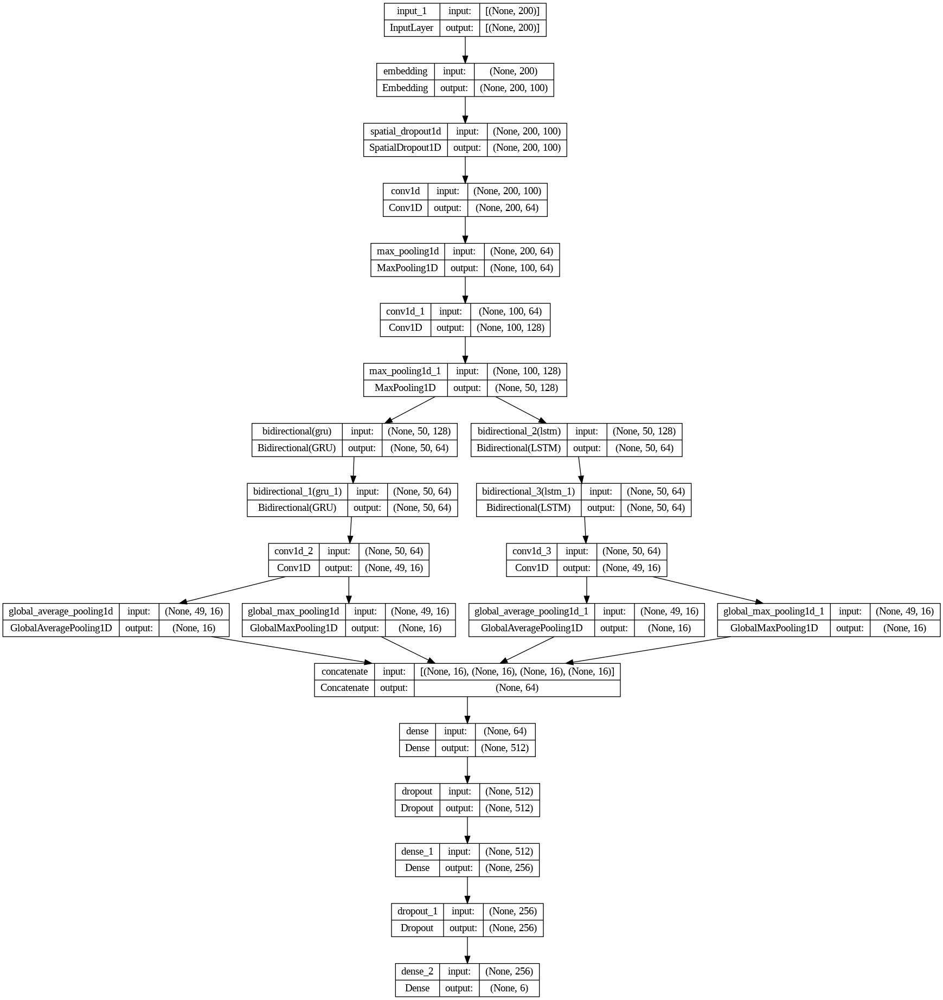

In [ ]:
from IPython.display import Image
Image(filename='model_plot2.png')

In [ ]:
texts_train = d_train['content_cleansing'].values
texts_test = d_test['content_cleansing'].values
y_train = d_train['comment_type'].values
y_test =  d_test['comment_type'].values

In [ ]:
# from sklearn.preprocessing import LabelEncoder

# # Create a LabelEncoder instance
# label_encoder = LabelEncoder()

# # Fit the encoder to the comment_type labels
# label_encoder.fit(['fear', 'disgust', 'surprise', 'joy', 'sadness', 'anger'])

# # Transform the comment_type labels to numeric values
# y_train_encoded = label_encoder.transform(y_train)

# # Print the encoded labels
# print(y_train_encoded)

[2 2 1 ... 0 0 4]


In [ ]:
# from sklearn.preprocessing import LabelEncoder

# # Create a LabelEncoder instance
# label_encoder = LabelEncoder()

# # Fit the encoder to the comment_type labels
# label_encoder.fit(['fear', 'disgust', 'surprise', 'joy', 'sadness', 'anger'])

# # Transform the comment_type labels to numeric values
# y_test_encoded = label_encoder.transform(y_test)

# # Print the encoded labels
# print(y_test_encoded)

[5 4 3 ... 3 2 3]


In [ ]:

# y_train = y_train_encoded
# y_test =  y_test_encoded

In [ ]:
pip install plot_keras_history

Epoch 1/10
3065/3065 [==============================] - 175s 41ms/step - loss: 1.2667 - accuracy: 0.4910 - val_loss: 1.7551 - val_accuracy: 0.2570
Epoch 2/10
3065/3065 [==============================] - 100s 33ms/step - loss: 0.7119 - accuracy: 0.7528 - val_loss: 0.9152 - val_accuracy: 0.7353
Epoch 3/10
3065/3065 [==============================] - 100s 33ms/step - loss: 0.4833 - accuracy: 0.8405 - val_loss: 0.6927 - val_accuracy: 0.7783
Epoch 4/10
3065/3065 [==============================] - 100s 33ms/step - loss: 0.3624 - accuracy: 0.8825 - val_loss: 0.9219 - val_accuracy: 0.6531
Epoch 5/10
3065/3065 [==============================] - 100s 32ms/step - loss: 0.2864 - accuracy: 0.9107 - val_loss: 0.5450 - val_accuracy: 0.7999
Epoch 6/10
3065/3065 [==============================] - 98s 32ms/step - loss: 0.2346 - accuracy: 0.9277 - val_loss: 0.4199 - val_accuracy: 0.8532
Epoch 7/10
3065/3065 [==============================] - 100s 33ms/step - loss: 0.1989 - accuracy: 0.9392 - val_loss: 0.

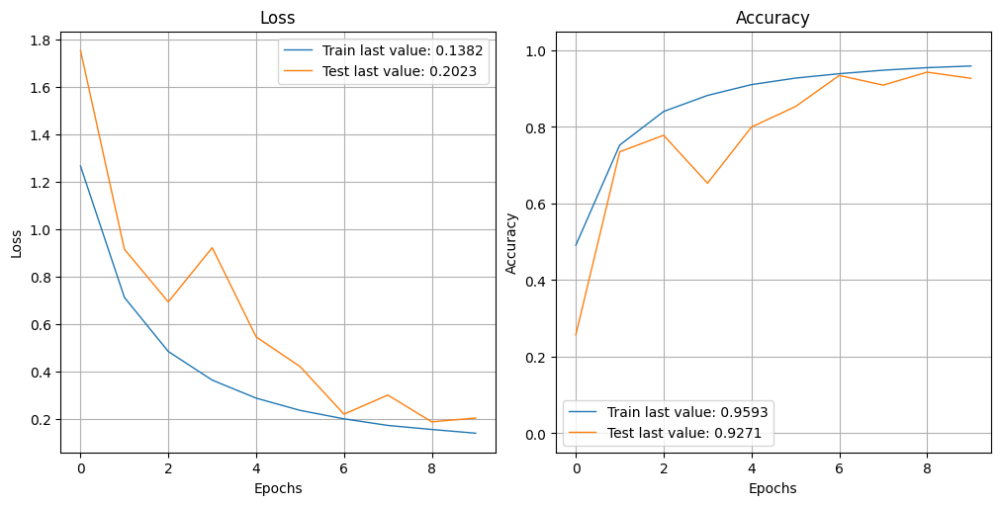

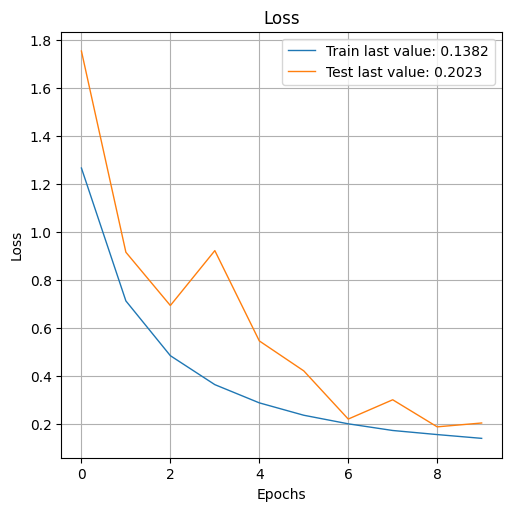

In [ ]:
from plot_keras_history import show_history, plot_history
import matplotlib.pyplot as plt
history = text_model.fit(texts_train, y_train)
show_history(history)
plot_history(history, single_graphs=True)
plt.close()

In [ ]:
print(history.history.keys())

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


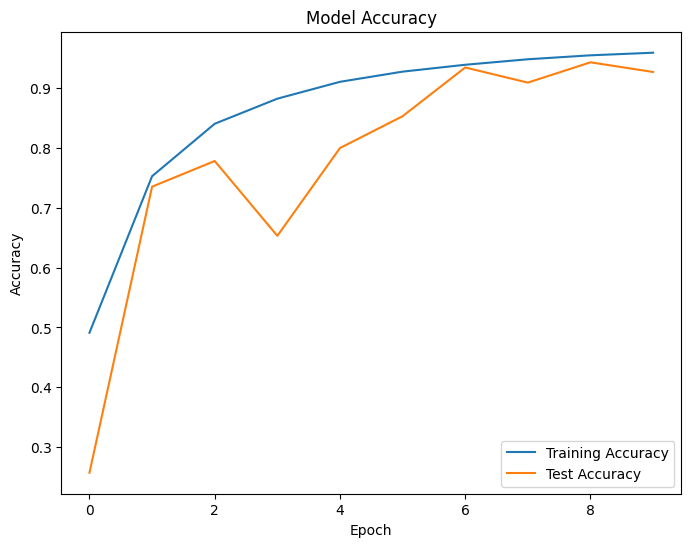

In [ ]:
plt.figure(figsize=(8, 6))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Test Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.show()

In [ ]:
text_model.score(texts_test, y_test)

In [ ]:
from sklearn.metrics import classification_report

**LIME**

**'sadness': 0,
    'joy': 1,
    'angry': 2,
    'disgust': 3,
    'surprise': 4,
    'fear': 5**

Sample 163: last 80 words (only part used by the model)
--------------------------------------------------
আমি মাটিতে আঘাত করেছি আমার মনে হচ্ছে বাবা পুরোপুরি যেতে দিন এবং আমি আতঙ্কিত হয়ে পড়ি
--------------------------------------------------
True class:  5
157/157 [==============================] - 3s 17ms/step


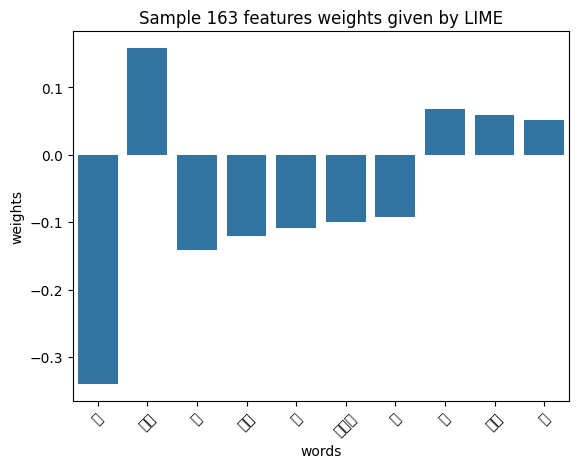

In [ ]:
import seaborn as sns
%matplotlib inline
from collections import OrderedDict
from lime.lime_text import LimeTextExplainer

import seaborn as sns
sns.despine()
# We choose a sample from test set
idx =163
idx2 =91
idx3=28
text_sample = texts_test[idx]
text_sample2 = texts_test[idx2]
text_sample3 = texts_test[idx3]
class_names = ['0', '1' , '2' , '3' , '4' , '5']

print('Sample {}: last 80 words (only part used by the model)'.format(idx))
print('-'*50)
print(" ".join(text_sample.split()[-80:]))
print('-'*50)
# print('Probability(positive) =', text_model.predict_proba([text_sample])[0,1])
print("True class: ",y_test[idx])

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample, text_model.predict_proba, num_features=10)

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})

sns.barplot(x="words", y="weights", data=lime_weights);
plt.xticks(rotation=45)
plt.title('Sample {} features weights given by LIME'.format(idx));

In [ ]:
exp = explainer.explain_instance(texts_test[idx], text_model.predict_proba, num_features=6, top_labels=10)
print(exp.available_labels())

157/157 [==============================] - 1s 9ms/step
[5, 0, 1, 2, 4, 3]


In [ ]:
exp.show_in_notebook(text=texts_test[idx], labels=(5,))

Sample 91: last 80 words (only part used by the model)
--------------------------------------------------
আমি আপনাকে যতটা অসন্তুষ্ট করি ততই আমি বিরক্ত এবং অযৌক্তিকভাবে রাগ অনুভব করি যখনই আপনি যখন ঘুরে দেখেন যে আপনার সামান্যতম মূর্খতা আমাকে অসুস্থ করে তুলেছে
--------------------------------------------------
True class:  2
157/157 [==============================] - 1s 9ms/step


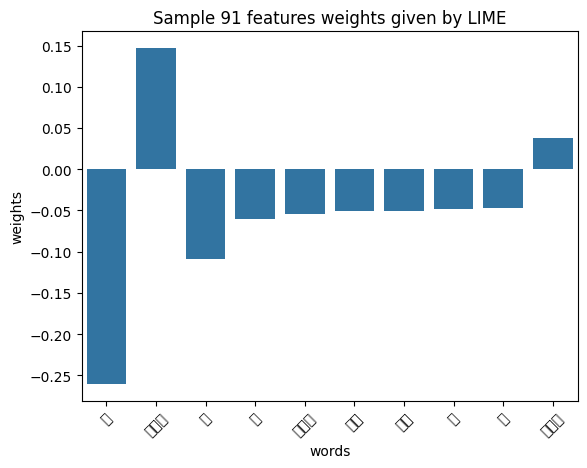

In [ ]:
import seaborn as sns
%matplotlib inline
from collections import OrderedDict
from lime.lime_text import LimeTextExplainer

import seaborn as sns
sns.despine()
# We choose a sample from test set
idx = 91
text_sample = texts_test[idx]
text_sample2 = texts_test[idx2]
text_sample3 = texts_test[idx3]
class_names = ['0', '1' , '2' , '3' , '4' , '5']

print('Sample {}: last 80 words (only part used by the model)'.format(idx))
print('-'*50)
print(" ".join(text_sample.split()[-80:]))
print('-'*50)
# print('Probability(positive) =', text_model.predict_proba([text_sample])[0,1])
print("True class: ",y_test[idx])

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample, text_model.predict_proba, num_features=10)

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})

sns.barplot(x="words", y="weights", data=lime_weights);
plt.xticks(rotation=45)
plt.title('Sample {} features weights given by LIME'.format(idx));

In [ ]:
exp = explainer.explain_instance(texts_test[idx], text_model.predict_proba, num_features=6, top_labels=10)
print(exp.available_labels())

157/157 [==============================] - 3s 17ms/step
[2, 0, 5, 1, 3, 4]


In [ ]:
exp.show_in_notebook(text=texts_test[idx], labels=(2,))

Sample 11: last 80 words (only part used by the model)
--------------------------------------------------
আপনার কি মনে হয় না যে আপনি নিতান্তই একজন স্বার্থপর এর মতো আপনার বাক্য ব্যয় করেছেন জীবন যাপন এর সব সুযোগ সুবিধা পাওয়া যাই বটে তবে এটা ভদ্র সমাজ তাই মুখে চোখে দেখাতেই অনেক কিছু মেনে নেই
--------------------------------------------------
True class:  3
157/157 [==============================] - 3s 19ms/step


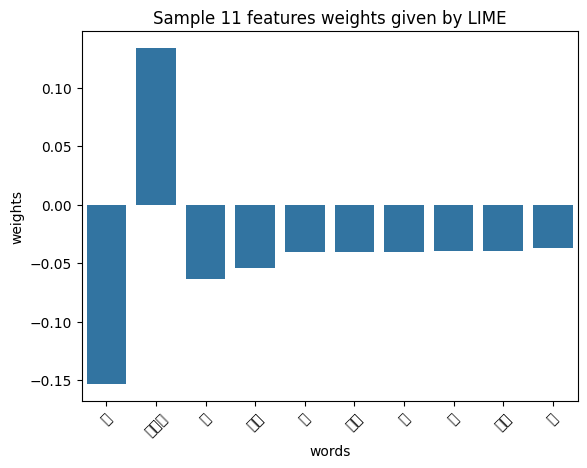

In [ ]:
import seaborn as sns
%matplotlib inline
from collections import OrderedDict
from lime.lime_text import LimeTextExplainer

import seaborn as sns
sns.despine()
# We choose a sample from test set
idx = 11
text_sample = texts_test[idx]
text_sample2 = texts_test[idx2]
text_sample3 = texts_test[idx3]
class_names = ['0', '1' , '2' , '3' , '4' , '5']

print('Sample {}: last 80 words (only part used by the model)'.format(idx))
print('-'*50)
print(" ".join(text_sample.split()[-80:]))
print('-'*50)
# print('Probability(positive) =', text_model.predict_proba([text_sample])[0,1])
print("True class: ",y_test[idx])

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample, text_model.predict_proba, num_features=10)

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})

sns.barplot(x="words", y="weights", data=lime_weights);
plt.xticks(rotation=45)
plt.title('Sample {} features weights given by LIME'.format(idx));

In [ ]:
exp = explainer.explain_instance(texts_test[idx], text_model.predict_proba, num_features=6, top_labels=10)
print(exp.available_labels())

157/157 [==============================] - 3s 19ms/step
[3, 0, 2, 1, 4, 5]


In [ ]:
exp.show_in_notebook(text=texts_test[idx], labels=(3,))

Sample 506: last 80 words (only part used by the model)
--------------------------------------------------
চারিদিকে বিল আশেপাশে কোন বাড়িঘর নাই তাছাড়া রাত বাজে টা এত রাতে এমন নির্জন জায়গায় একটা মেয়ে
--------------------------------------------------
True class:  4
157/157 [==============================] - 1s 9ms/step


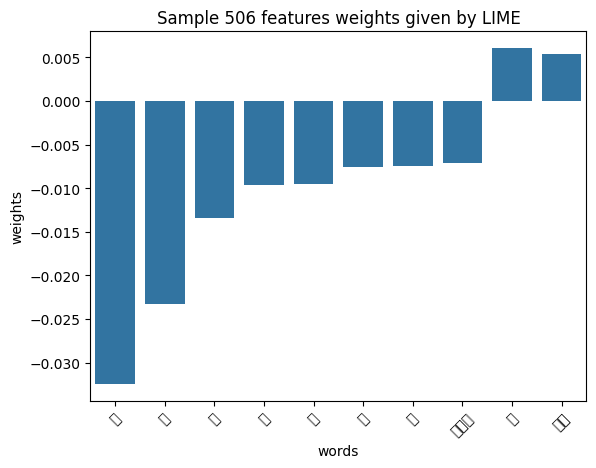

In [ ]:
import seaborn as sns
%matplotlib inline
from collections import OrderedDict
from lime.lime_text import LimeTextExplainer

import seaborn as sns
sns.despine()
# We choose a sample from test set
idx = 506
text_sample = texts_test[idx]
text_sample2 = texts_test[idx2]
text_sample3 = texts_test[idx3]
class_names = ['0', '1' , '2' , '3' , '4' , '5']

print('Sample {}: last 80 words (only part used by the model)'.format(idx))
print('-'*50)
print(" ".join(text_sample.split()[-80:]))
print('-'*50)
# print('Probability(positive) =', text_model.predict_proba([text_sample])[0,1])
print("True class: ",y_test[idx])

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample, text_model.predict_proba, num_features=10)

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})

sns.barplot(x="words", y="weights", data=lime_weights);
plt.xticks(rotation=45)
plt.title('Sample {} features weights given by LIME'.format(idx));

In [ ]:
exp = explainer.explain_instance(texts_test[idx], text_model.predict_proba, num_features=6, top_labels=10)
print(exp.available_labels())

157/157 [==============================] - 1s 9ms/step
[4, 1, 5, 2, 0, 3]


In [ ]:
exp.show_in_notebook(text=texts_test[idx], labels=(4,))

Sample 525: last 80 words (only part used by the model)
--------------------------------------------------
ভাই আমার অপরাধ কি জানেন আমার অপরাধ হলো আমি দেখতে কালো আপনাদের মত সাদা চামড়ার কিছু মানুষ মনে করে আমাদের মত কালো মানুষের গা থেকে গন্ধ বের হয় আপনাদের ধারণা পৃথিবীর সমস্ত খারাপ মানুষ কালোই হয়৷
--------------------------------------------------
True class:  0
157/157 [==============================] - 3s 16ms/step


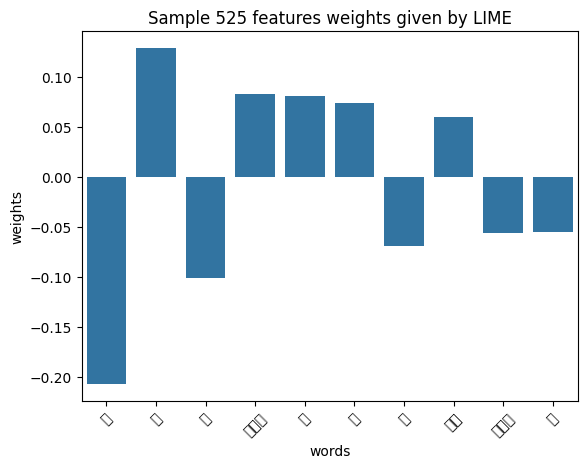

In [ ]:
import seaborn as sns
%matplotlib inline
from collections import OrderedDict
from lime.lime_text import LimeTextExplainer

import seaborn as sns
sns.despine()
# We choose a sample from test set
idx = 525
text_sample = texts_test[idx]
text_sample2 = texts_test[idx2]
text_sample3 = texts_test[idx3]
class_names = ['0', '1' , '2' , '3' , '4' , '5']

print('Sample {}: last 80 words (only part used by the model)'.format(idx))
print('-'*50)
print(" ".join(text_sample.split()[-80:]))
print('-'*50)
# print('Probability(positive) =', text_model.predict_proba([text_sample])[0,1])
print("True class: ",y_test[idx])

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample, text_model.predict_proba, num_features=10)

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})

sns.barplot(x="words", y="weights", data=lime_weights);
plt.xticks(rotation=45)
plt.title('Sample {} features weights given by LIME'.format(idx));

In [ ]:
exp = explainer.explain_instance(texts_test[idx], text_model.predict_proba, num_features=6, top_labels=10)
print(exp.available_labels())

157/157 [==============================] - 3s 18ms/step
[0, 2, 1, 5, 4, 3]


In [ ]:
exp.show_in_notebook(text=texts_test[idx], labels=(0,))

In [ ]:
import seaborn as sns
%matplotlib inline
from collections import OrderedDict
from lime.lime_text import LimeTextExplainer

import seaborn as sns
sns.despine()
# We choose a sample from test set
idx = 549 #530 #538
text_sample = texts_test[idx]
text_sample2 = texts_test[idx2]
text_sample3 = texts_test[idx3]
class_names = ['0', '1' , '2' , '3' , '4' , '5']

print('Sample {}: last 80 words (only part used by the model)'.format(idx))
print('-'*50)
print(" ".join(text_sample.split()[-80:]))
print('-'*50)
# print('Probability(positive) =', text_model.predict_proba([text_sample])[0,1])
print("True class: ",y_test[idx])

explainer = LimeTextExplainer(class_names=class_names)
explanation = explainer.explain_instance(text_sample, text_model.predict_proba, num_features=10)

weights = OrderedDict(explanation.as_list())
lime_weights = pd.DataFrame({'words': list(weights.keys()), 'weights': list(weights.values())})

# sns.barplot(x="words", y="weights", data=lime_weights);
# plt.xticks(rotation=45)
# plt.title('Sample {} features weights given by LIME'.format(idx));

Sample 549: last 80 words (only part used by the model)
--------------------------------------------------
শুধু বাংলাদেশ না সারা ক্রিকেট বিশ্ব গতকাল আনন্দ উৎযাপন করছে
--------------------------------------------------
True class:  1
157/157 [==============================] - 3s 18ms/step


<Figure size 640x480 with 0 Axes>

In [ ]:
exp = explainer.explain_instance(texts_test[idx], text_model.predict_proba, num_features=6, top_labels=10)
print(exp.available_labels())

157/157 [==============================] - 1s 9ms/step
[1, 0, 2, 4, 5, 3]


In [ ]:
exp.show_in_notebook(text=texts_test[idx], labels=(1,))

In [ ]:
# explanation.show_in_notebook(text=True)

**BI_LSTM**

In [ ]:
# !pip install tensorflow

In [ ]:
# from sklearn.base import BaseEstimator, TransformerMixin
# from keras.layers import concatenate, Conv1D, GRU
# from keras.layers import GlobalAveragePooling1D, GlobalMaxPooling1D
# from tensorflow.keras.utils import plot_model, model_to_dot
# import tensorflow as tf
# from tensorflow.keras.layers import LSTM
# from tensorflow.keras.layers import Input
# from keras import backend as K
# from tensorflow.keras import Input, Model
# from tensorflow.keras.layers import Embedding, SpatialDropout1D, Bidirectional, GRU, Conv1D, GlobalAveragePooling1D, GlobalMaxPooling1D, concatenate, Dense, Dropout
# from tensorflow.keras.optimizers import Adam
# from tensorflow.keras.losses import SparseCategoricalCrossentropy
# from tensorflow.keras.metrics import Accuracy
# from sklearn.preprocessing import LabelEncoder
# from sklearn.metrics import accuracy_score
# from keras.preprocessing.text import Tokenizer
# from keras.preprocessing.sequence import pad_sequences
# import re
# import numpy as np

In [ ]:
# !pip install keras

In [ ]:
# !pip install keras --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.2/311.2 kB 29.9 MB/s eta 0:00:00
  Attempting uninstall: keras
    Found existing installation: keras 2.15.0
    Uninstalling keras-2.15.0:
      Successfully uninstalled keras-2.15.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.15.0 requires keras<2.16,>=2.15.0, but you have keras 3.1.1 which is incompatible.


In [ ]:
# from sklearn.base import BaseEstimator, TransformerMixin
# from keras.models import Model, Input
# from keras.layers import Dense, LSTM, Dropout, Embedding, SpatialDropout1D, Bidirectional, concatenate, Flatten
# from keras.layers import GlobalAveragePooling1D, GlobalMaxPooling1D
# from keras.utils.vis_utils import plot_model
# from keras.preprocessing.text import Tokenizer
# from keras.preprocessing.sequence import pad_sequences
# from sklearn.metrics import accuracy_score
# import regex as re
# import numpy as np
# class KerasTextClassifier(BaseEstimator, TransformerMixin):
#     '''Wrapper class for keras text classification models that takes raw text as input.'''

#     def __init__(self, max_words=30000, input_length=100, emb_dim=20, n_classes=3, epochs=5, batch_size=32):
#         self.max_words = max_words
#         self.input_length = input_length
#         self.emb_dim = emb_dim
#         self.n_classes = n_classes
#         self.epochs = epochs
#         self.bs = batch_size
#         self.classes_ = None
#         self.model = self._get_model()
#         self.tokenizer = Tokenizer(num_words=self.max_words+1,
#                                    lower=True, split=' ', oov_token="UNK")

#     def _get_model(self):
#         input_text = Input((self.input_length,))
#         text_embedding = Embedding(input_dim=self.max_words + 2, output_dim=self.emb_dim,
#                                    input_length=self.input_length, mask_zero=False)(input_text)
#         text_embedding = SpatialDropout1D(0.5)(text_embedding)
#         bilstm = Bidirectional(LSTM(units=32, return_sequences=True, recurrent_dropout=0.5))(text_embedding)
#         # x = concatenate([GlobalAveragePooling1D()(bilstm), GlobalMaxPooling1D()(bilstm)])
#         flatten_layer = Flatten()
#         x= flatten_layer(bilstm)
#         x = Dense(512, activation="relu")(x)
#         x = Dropout(0.5)(x)
#         out = Dense(units=self.n_classes, activation="softmax")(x)
#         model = Model(input_text, out)
#         model.compile(optimizer="adam",
#                       loss="sparse_categorical_crossentropy",
#                       metrics=["accuracy"])
#         plot_model(model, to_file='model_plot.png',show_shapes=True, show_layer_names=True)
#         return model

#     def _get_sequences(self, texts):
#         seqs = self.tokenizer.texts_to_sequences(texts)
#         return pad_sequences(seqs, maxlen=self.input_length, value=0)

#     def _preprocess(self, texts):
#         return [re.sub(r"\d", "DIGIT", x) for x in texts]

#     def fit(self, X, y):
#         '''
#         Fit the vocabulary and the model.

#         :params:
#         X: list of texts.
#         y: labels.
#         '''

#         self.tokenizer.fit_on_texts(self._preprocess(X))
#         self.tokenizer.word_index = {e: i for e,i in self.tokenizer.word_index.items() if i <= self.max_words}
#         self.tokenizer.word_index[self.tokenizer.oov_token] = self.max_words + 1
#         seqs = self._get_sequences(self._preprocess(X))
#         self.model.fit(seqs, y, batch_size=self.bs, epochs=self.epochs, validation_split=0.1)

#     def predict_proba(self, X, y=None):
#         seqs = self._get_sequences(self._preprocess(X))
#         return self.model.predict(seqs)

#     def predict(self, X, y=None):
#         return np.argmax(self.predict_proba(X), axis=1)

#     def score(self, X, y):
#         y_pred = self.predict(X)
#         return accuracy_score(y, y_pred)

#     def trasnform(self, X):
#         return self._get_sequences(self._preprocess(X))

#     def _encode_label(self, y):
#         return self.label_encoder.transform(y)

#     def _decode_label(self, y):
#         return self.label_encoder.inverse_transform(y)

#     def _init_label_encoder(self, y):
#         self.label_encoder = LabelEncoder()
#         self.label_encoder.fit(y)
#         self.classes_ = self.label_encoder.classes_

#     def _encode_feature(self, x):
#         self.tokenizer.fit_on_texts(self._preprocess(x))
#         self.tokenizer.word_index = {e: i for e,i in self.tokenizer.word_index.items() if i <= self.word_cnt}
#         self.tokenizer.word_index[self.tokenizer.oov_token] = self.word_cnt + 1
#         return self._get_sequences(self._preprocess(x))

#     def predict_decode(self, X, y=None):
#         return self._decode_label(self.predict(X))

#     def summary(self):
#        return self.model.summary()
# text_model = KerasTextClassifier(epochs=2, max_words=20000, input_length=200)

ImportError: cannot import name 'Input' from 'keras.models' (/usr/local/lib/python3.10/dist-packages/keras/models/__init__.py)

In [ ]:
# text_model.summary()

In [ ]:
# from IPython.display import Image
# Image(filename='model_plot.png')

In [ ]:
# history = text_model.fit(texts_train, y_train)

In [ ]:
# text_model.score(texts_test, y_test)